#### 0. Change directory

In [1]:
# Reference: https://stackoverflow.com/questions/15514593/importerror-no-module-named-when-trying-to-run-python-script/15622021#15622021
import sys
sys.path.append(r'S:\\Grid_Orientation\\LISFLOOD_FP\\Analysis')

#### 1. Packages

In [2]:
from folder import *

# Packages for generating random angle, x, and y values
from randomisation import random_values_generation

# Packages for flowdepth values extraction
from depthValue import get_flowdepth_parallelism

# Packages for impact calculation
from impactCalculation import flowdepth_raster_nobackground, flowdepthmap_onepolygon_parallelism

# Packages for variation calculation
from statisticCalculation import calculation_dict

# Packages for plotting map
from statisticPlot import map_plotting, area_building_plotting
import statisticPlot
import matplotlib.pyplot as plt

# For raster/polygon manipulation
import rioxarray as rxr
import geopandas as gpd

# For flood threshold plotting
from floodThreshold import flood_rate_comparison, flood_rate_plotting

#### 2. Data preparation

In [3]:
# Resolution
resolution = 10

# Transformation values
ran_trans = random_values_generation(
    1,
    5,
    [0, 90],
    [0, resolution/2],
    [0, resolution/2],
    'uniform',
    True
)

# Time to extract flowdepth (for flowdepth_extraction() function)
extract_name = "out.max"

# Flood rate
flood_rate = 0.1

# Building path
building_path = fr"S:\new_versions\data\buildings\lds-nz-building-outlines-all-sources-SHP_002.zip"
building_data = gpd.read_file(building_path)

# Terrain path 
terrain_data = rxr.open_rasterio(fr"{original_lidar_path}\\shading\\terrain_shading.tiff")

#### 4. Execution

##### 4.1. Flowdepth csv generation

In [4]:
%%time
df = get_flowdepth_parallelism(30)

CPU times: total: 33.8 s
Wall time: 1min 47s


In [5]:
# import pandas as pd
# df = pd.read_csv(fr"S:\\new_versions\\vers13\\5_analysis\\untransformed_csv\\all_simulations.csv")

##### 4.2. Impact calculation

In [6]:
%%time
flowdepth_raster_nobackground(df, flood_rate)

CPU times: total: 891 ms
Wall time: 1.19 s


In [7]:
%%time
flowdepthmap_onepolygon_parallelism(df, flood_rate, 30)

CPU times: total: 188 ms
Wall time: 12.8 s


#### 4.2. Variation calculation

In [16]:
%%time
statistic_dict = calculation_dict(
    df, resolution,
    building_path,
    flood_rate,
    True
)

CPU times: total: 2.73 s
Wall time: 3.1 s


#### 4.3. Map plotting

CPU times: total: 1min 13s
Wall time: 1min 25s


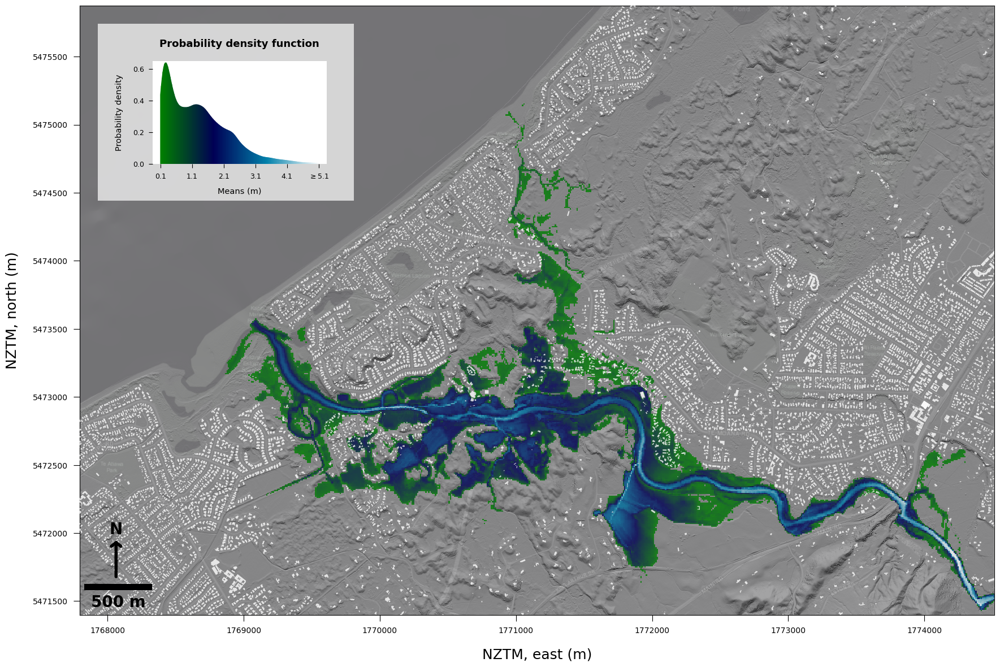

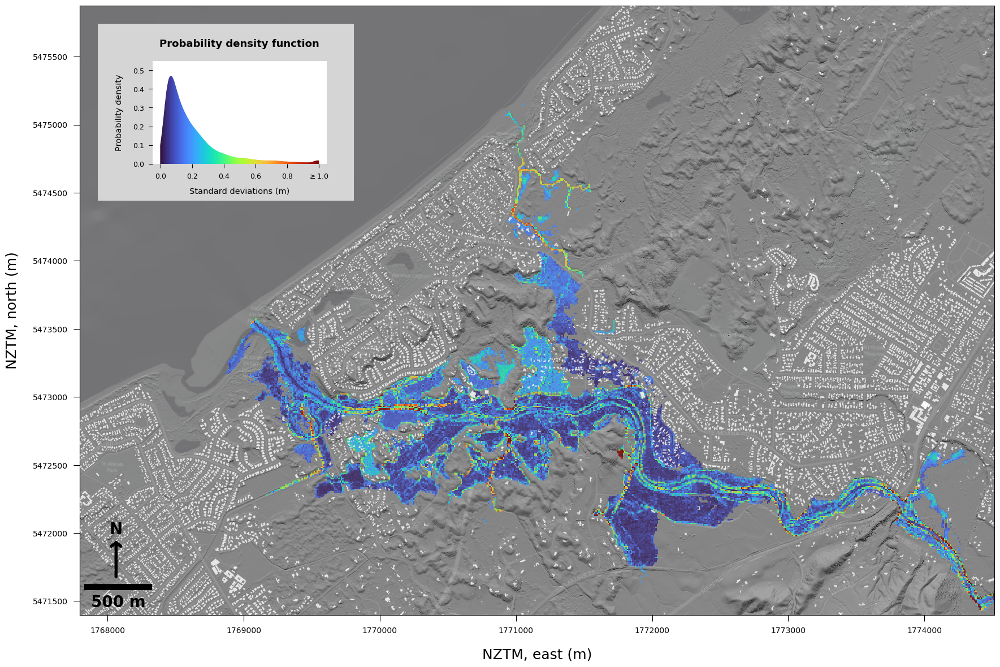

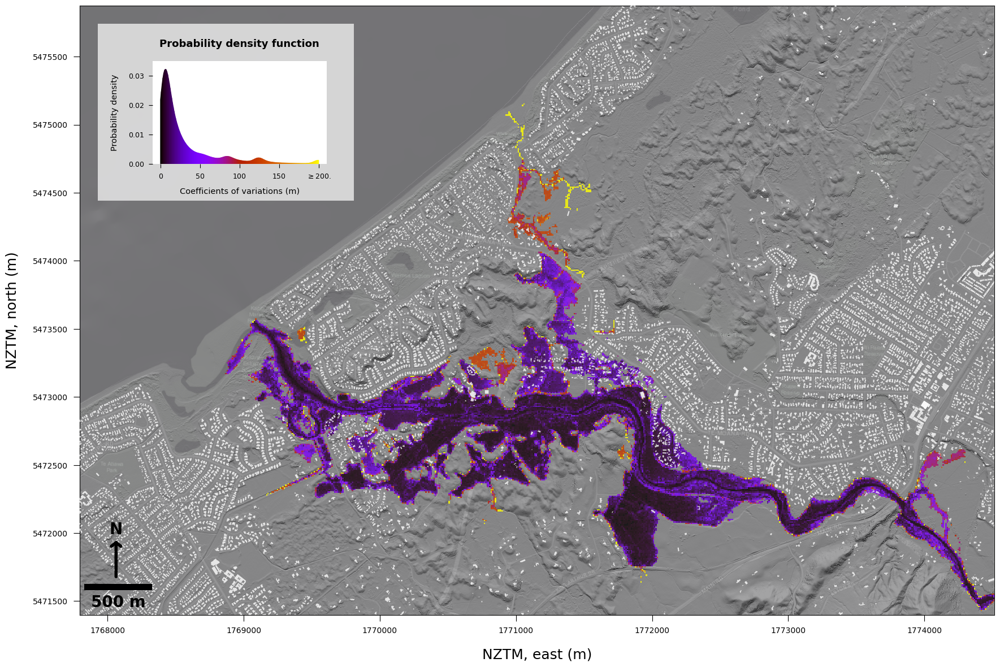

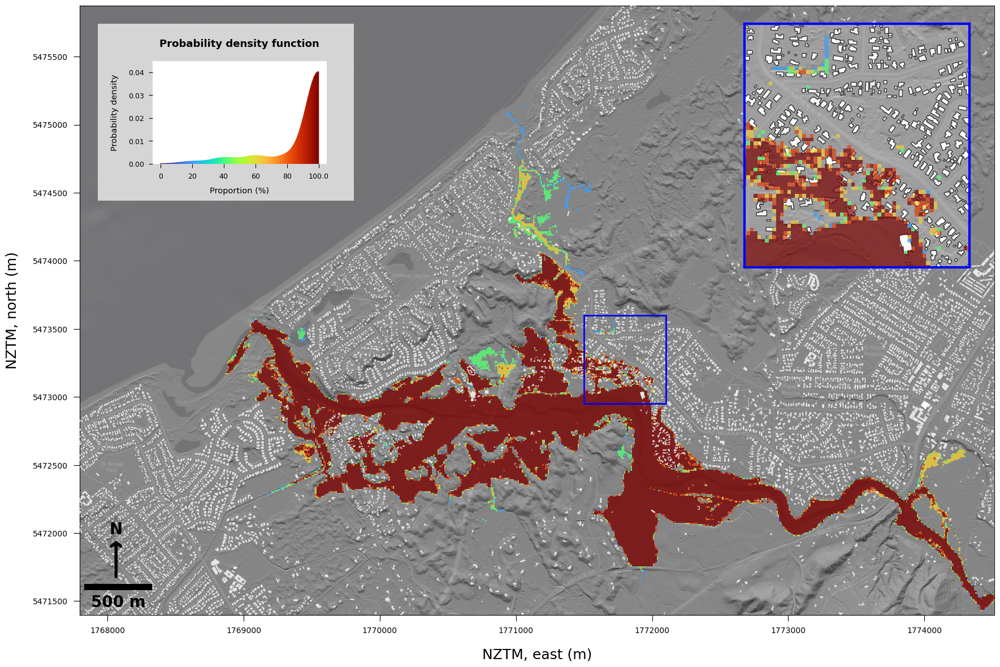

In [17]:
%%time
map_plotting(
    ['mean', 'sd', 'cv', 'cell'],
    building_data,
    terrain_data
)

#### 4.4. Buildings and Areas plotting

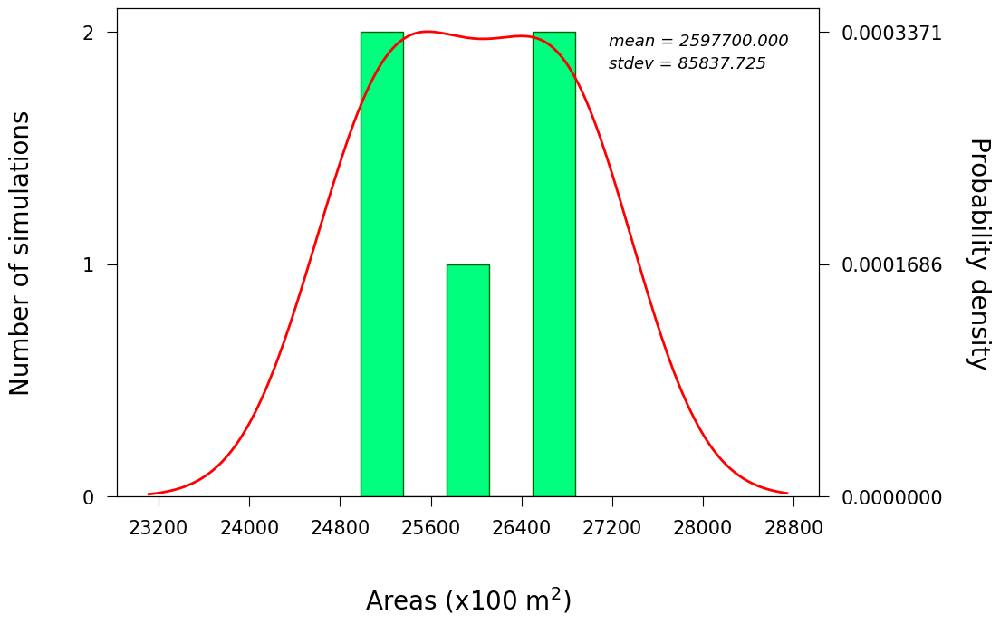

In [10]:
area_building_plotting(
    (10, 7),
    statistic_dict['area'],
    [0.7, 0.95],
    'area'
)

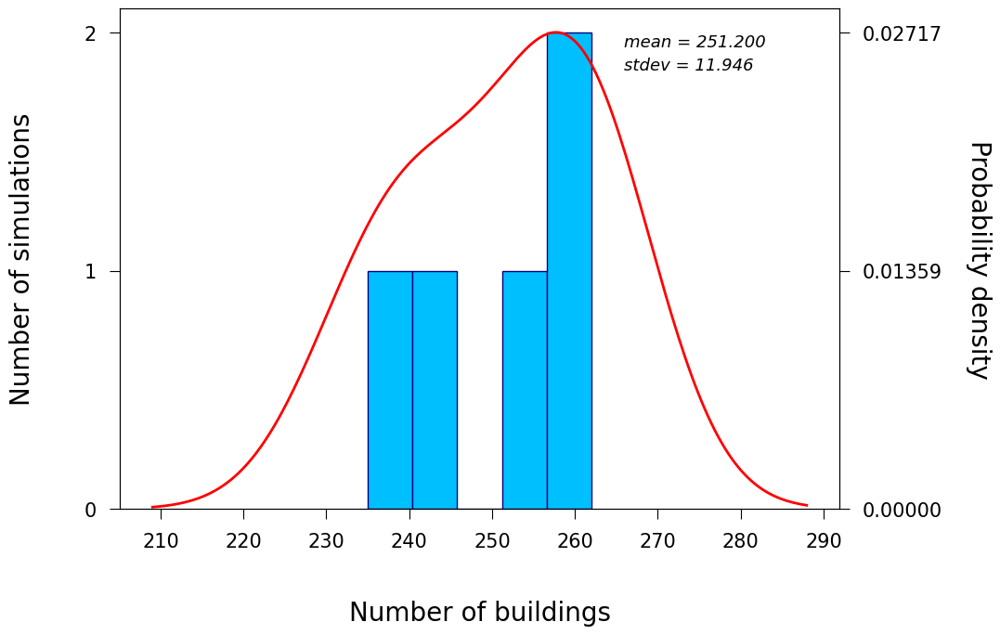

In [11]:
area_building_plotting(
    (10, 7),
    statistic_dict['building'],
    [0.7, 0.95],
    'building'
)

#### 4.5. Error bars

In [19]:
# Flood range
flood_rate_range = [0.01, 0.5, 0.01, 3]

# Figsize
figsize=(15, 7)

# Rate of standard deviation
sd_rate = 2

In [20]:
%%time
# Means and standard deviations calculation
mean_building_arr, sd_building_arr, mean_area_arr, sd_area_arr = flood_rate_comparison(flood_rate_range, df, 30, resolution, building_path)

CPU times: total: 2min 34s
Wall time: 13min 41s


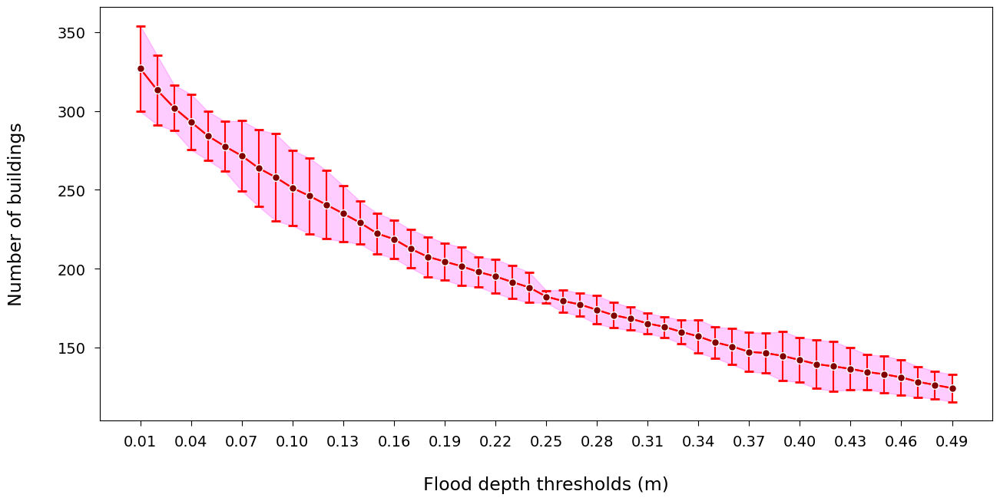

In [21]:
# Calculation option
calculation_option = 'building'

# Plotting
flood_rate_plotting(figsize, 
                    flood_rate_range, 
                    mean_building_arr, sd_building_arr, sd_rate,
                    calculation_option
                    )

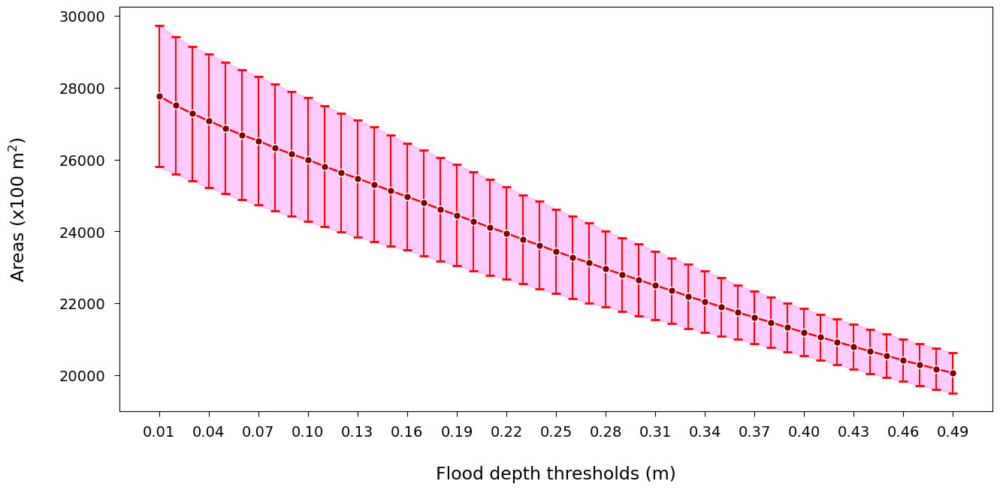

In [23]:
# Calculation option
calculation_option = 'area'

# Plotting
flood_rate_plotting(figsize, 
                    flood_rate_range, 
                    mean_area_arr, sd_area_arr, sd_rate,
                    calculation_option
                    )